All the data in this dataset is from **"Montgomery County, Pennsylvania".**


In this kernel, we will Analyze and Visualize the 911 calls data based on different variables. I try to make all of my kernels very easy to understand for someone who is just starting their journey on Kaggle and here to learn something because this is what I am doing and I am just a novice starting on my kaggle journey. I hope you like my kernel and give it an Upvote.


I wish everyone good luck for their learning journey on kaggle.

In [1]:
import numpy as np 
import pandas as pd
import seaborn as sb
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib import rcParams
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import datetime as dt
import folium
from folium.plugins import MarkerCluster
from plotly.offline import iplot
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
plt.style.use('ggplot')





import warnings
warnings.filterwarnings('ignore')

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/montcoalert/911.csv


# Loading Data

In [2]:
data = pd.read_csv('../input/montcoalert/911.csv')

# Quick Look at Data

In [3]:
data.shape

(663522, 9)

In [4]:
data.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:10:52,NEW HANOVER,REINDEER CT & DEAD END,1
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:29:21,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 14:39:21,NORRISTOWN,HAWS AVE,1
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 16:47:36,NORRISTOWN,AIRY ST & SWEDE ST,1
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 16:56:52,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1


In [5]:
data.tail()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
663517,40.157956,-75.348060,SUNSET AVE & WOODLAND AVE; EAST NORRITON; 2020...,19403.0,Traffic: VEHICLE ACCIDENT -,2020-07-29 15:46:51,EAST NORRITON,SUNSET AVE & WOODLAND AVE,1
663518,40.136306,-75.428697,EAGLEVILLE RD & BUNTING CIR; LOWER PROVIDENCE...,19403.0,EMS: GENERAL WEAKNESS,2020-07-29 15:52:19,LOWER PROVIDENCE,EAGLEVILLE RD & BUNTING CIR,1
663519,40.013779,-75.300835,HAVERFORD STATION RD; LOWER MERION; Station 3...,19041.0,EMS: VEHICLE ACCIDENT,2020-07-29 15:52:52,LOWER MERION,HAVERFORD STATION RD,1
663520,40.121603,-75.351437,MARSHALL ST & HAWS AVE; NORRISTOWN; 2020-07-29...,19401.0,Fire: BUILDING FIRE,2020-07-29 15:54:08,NORRISTOWN,MARSHALL ST & HAWS AVE,1
663521,40.015046,-75.299674,HAVERFORD STATION RD & W MONTGOMERY AVE; LOWER...,19041.0,Traffic: VEHICLE ACCIDENT -,2020-07-29 15:52:46,LOWER MERION,HAVERFORD STATION RD & W MONTGOMERY AVE,1


In [6]:
data.describe()

,lat,lng,zip,e
count,663522.000000,663522.000000,583323.000000,663522.0
mean,40.158162,-75.300105,19236.055791,1.0
std,0.220641,1.672884,298.222637,0.0
min,0.000000,-119.698206,1104.000000,1.0
25%,40.100344,-75.392735,19038.000000,1.0
50%,40.143927,-75.305143,19401.000000,1.0
75%,40.229008,-75.211865,19446.000000,1.0
max,51.335390,87.854975,77316.000000,1.0


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 663522 entries, 0 to 663521
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   lat        663522 non-null  float64
 1   lng        663522 non-null  float64
 2   desc       663522 non-null  object 
 3   zip        583323 non-null  float64
 4   title      663522 non-null  object 
 5   timeStamp  663522 non-null  object 
 6   twp        663229 non-null  object 
 7   addr       663522 non-null  object 
 8   e          663522 non-null  int64  
dtypes: float64(3), int64(1), object(5)
memory usage: 45.6+ MB


In [8]:
data.sample(frac=0.00002, random_state=1)

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
490393,40.175534,-75.202895,STOUT RD & N FIEDLER RD; UPPER DUBLIN; Statio...,19002.0,EMS: SUBJECT IN PAIN,2019-05-01 09:47:14,UPPER DUBLIN,STOUT RD & N FIEDLER RD,1
364073,40.127450,-75.361844,MARSHALL ST & N MONTGOMERY AVE; WEST NORRITON...,19403.0,EMS: FALL VICTIM,2018-06-27 14:06:03,WEST NORRITON,MARSHALL ST & N MONTGOMERY AVE,1
375374,40.257678,-75.221200,DOYLESTOWN PIKE & CLAREMONT DR; MONTGOMERY; S...,NaN,EMS: FRACTURE,2018-07-24 12:19:35,MONTGOMERY,DOYLESTOWN PIKE & CLAREMONT DR,1
377554,40.172725,-75.150265,CHURCH RD & SCHOOL RD; HORSHAM; Station 352; ...,19044.0,EMS: SUBJECT IN PAIN,2018-07-30 07:28:18,HORSHAM,CHURCH RD & SCHOOL RD,1
114054,40.102715,-75.308820,RIDGE PIKE & INDUSTRIAL WAY; PLYMOUTH; 2016-10...,19428.0,Traffic: VEHICLE ACCIDENT -,2016-10-02 15:37:29,PLYMOUTH,RIDGE PIKE & INDUSTRIAL WAY,1
336486,40.117287,-75.120198,HORACE AVE & OLD YORK RD; ABINGTON; 2018-04-18...,19001.0,Traffic: VEHICLE ACCIDENT -,2018-04-18 16:53:03,ABINGTON,HORACE AVE & OLD YORK RD,1
23141,40.207313,-75.399797,STUMP HALL RD & ANDERS RD; SKIPPACK; 2016-02-0...,19426.0,Traffic: VEHICLE ACCIDENT -,2016-02-06 09:39:46,SKIPPACK,STUMP HALL RD & ANDERS RD,1
13475,40.177608,-75.128356,EASTON RD & HORSHAM RD; HORSHAM; Station 352;...,19044.0,EMS: VEHICLE ACCIDENT,2016-01-15 04:23:12,HORSHAM,EASTON RD & HORSHAM RD,1
369877,40.243881,-75.616191,HIGH ST & BEECH ST; POTTSTOWN; 2018-07-11 @ 08...,19464.0,Traffic: ROAD OBSTRUCTION -,2018-07-11 08:17:11,POTTSTOWN,HIGH ST & BEECH ST,1
257214,40.076387,-75.151811,WISTAR DR & THORNBERRY RD; CHELTENHAM; 2017-10...,19095.0,Fire: FIRE ALARM,2017-10-09 14:23:02,CHELTENHAM,WISTAR DR & THORNBERRY RD,1


# Handling Missing Data

In [9]:
data.isnull().sum()

lat              0
lng              0
desc             0
zip          80199
title            0
timeStamp        0
twp            293
addr             0
e                0
dtype: int64

Lets leave zip for now we will only use it for the top 10 zip codes for most number of 911 calls.

In [10]:
data.dropna(subset=['twp'], inplace=True)

In [11]:
data.isnull().sum()

lat              0
lng              0
desc             0
zip          80030
title            0
timeStamp        0
twp              0
addr             0
e                0
dtype: int64

Alright, Lets move forward !!

# Feature Engineering

In [12]:
data['timeStamp'].head(3)

0    2015-12-10 17:10:52
1    2015-12-10 17:29:21
2    2015-12-10 14:39:21
Name: timeStamp, dtype: object

Our column 'timeStamp' is in Categorical format and hence we must convert it to 'Datetime' format.

In [13]:
data['timeStamp'] = pd.to_datetime(data['timeStamp'])

In [14]:
data['timeStamp'].head(3)

0   2015-12-10 17:10:52
1   2015-12-10 17:29:21
2   2015-12-10 14:39:21
Name: timeStamp, dtype: datetime64[ns]

## Adding new datetime columns

In [15]:
data['year'] = data['timeStamp'].dt.year
data['day'] = data['timeStamp'].dt.day
data['month'] = data['timeStamp'].dt.month
data['dayofweek'] = data['timeStamp'].dt.dayofweek
data['dayofyear'] = data['timeStamp'].dt.dayofyear
data['hour'] = data['timeStamp'].dt.hour

In [16]:
data.head(3)

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,year,day,month,dayofweek,dayofyear,hour
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:10:52,NEW HANOVER,REINDEER CT & DEAD END,1,2015,10,12,3,344,17
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:29:21,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1,2015,10,12,3,344,17
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 14:39:21,NORRISTOWN,HAWS AVE,1,2015,10,12,3,344,14


Adding one column to our data : 'reason_cat' for the category of reason. This will enable us to better understand and visualize the dataset.

### Category for different reasons

In [17]:
data['reason_cat'] = data['title'].apply(lambda x:x.split(':')[0])
data['reason_cat'].unique()

array(['EMS', 'Fire', 'Traffic'], dtype=object)

### All the reasons for 911 calls

In [18]:
data['title'] = data['title'].apply(lambda x:x.split(':')[1])

data['title'] = data['title'].apply(lambda x:x.split('-')[0]).apply(lambda x:x.strip())

# Now our data looks more badass
data['title'].unique()

array(['BACK PAINS/INJURY', 'DIABETIC EMERGENCY', 'GAS',
       'CARDIAC EMERGENCY', 'DIZZINESS', 'HEAD INJURY', 'NAUSEA/VOMITING',
       'RESPIRATORY EMERGENCY', 'SYNCOPAL EPISODE', 'VEHICLE ACCIDENT',
       'DISABLED VEHICLE', 'APPLIANCE FIRE', 'GENERAL WEAKNESS',
       'CARBON MONOXIDE DETECTOR', 'UNKNOWN MEDICAL EMERGENCY',
       'UNRESPONSIVE SUBJECT', 'ALTERED MENTAL STATUS', 'FIRE ALARM',
       'CVA/STROKE', 'ROAD OBSTRUCTION', 'SUBJECT IN PAIN',
       'HEMORRHAGING', 'FALL VICTIM', 'ASSAULT VICTIM', 'SEIZURES',
       'MEDICAL ALERT ALARM', 'ABDOMINAL PAINS', 'PUMP DETAIL',
       'FIRE INVESTIGATION', 'OVERDOSE', 'MATERNITY',
       'UNCONSCIOUS SUBJECT', 'CHOKING', 'LACERATIONS',
       'TRASH/DUMPSTER FIRE', 'UNKNOWN TYPE FIRE', 'BUILDING FIRE',
       'ELECTRICAL FIRE OUTSIDE', 'DEBRIS/FLUIDS ON HIGHWAY', 'FEVER',
       'ALLERGIC REACTION', 'VEHICLE LEAKING FUEL', 'FRACTURE',
       'BURN VICTIM', 'RESCUE', 'WOODS/FIELD FIRE',
       'FIRE SPECIAL SERVICE', 'VEHICLE 

## How many different reasons?

In [19]:
data['title'].nunique()

85

# Data Visualizations

Lets get out hands dirty

In [20]:
data.columns

Index(['lat', 'lng', 'desc', 'zip', 'title', 'timeStamp', 'twp', 'addr', 'e',
       'year', 'day', 'month', 'dayofweek', 'dayofyear', 'hour', 'reason_cat'],
      dtype='object')

## Different reason category for 911 calls

In [21]:
reason = pd.DataFrame({'reason':['EMS', 'Traffic', 'Fire'], 'count':[3265850, 227045, 98797]})
reason.style.background_gradient(cmap='Blues', subset=['count'])

,reason,count
0,EMS,3265850
1,Traffic,227045
2,Fire,98797


In [22]:
# Bar Chart
fig1 = px.bar(reason, reason['reason'], reason['count'], color_discrete_sequence=[px.colors.qualitative.Pastel], text=reason['count'])

fig1.update_layout(title={
                  'text': "Category of Reasons for 911 Calls",
                  'y':0.98,
                  'x':0.5,
                  'xanchor': 'center',
                  'yanchor': 'top'},
                  xaxis_title='Reason Category',
                  yaxis_title='Count',
                  showlegend=False,
                  template='ggplot2')

# -----------------------------------------------------------

# Pie Chart
fig2 = px.pie(reason, reason['reason'], reason['count'], 
              color_discrete_sequence=px.colors.qualitative.Pastel, hole=0.5)

fig2.update_layout(title={
                  'text': "Category of Reasons for 911 Calls (Pie Chart)",
                  'y':0.98,
                  'x':0.5,
                  'xanchor': 'center',
                  'yanchor': 'top'},
                   height=600,
                  template='plotly_white')

fig2.update_traces(textposition='inside', textinfo='percent+label', pull=[0.2, 0, 0])

fig2.data[0].marker.line.width = 2
fig2.data[0].marker.line.color = "black"

# -----------------------------------------------------------

fig1.show()
fig2.show()

* EMS (Emergency Medical Services) calls are the most frequent.
* Traffic calls are less frequent and Fire calls being the least frequent.

## Different reasons for 911 calls

Top 10 reasons for 911 calls in "Montgomery County, Pennsylvania".

In [23]:
data['title'].value_counts()\
             .head(10)\
             .to_frame(name='count')\
             .reset_index()\
             .style.background_gradient(cmap='Reds', subset=['count'])

,index,count
0,VEHICLE ACCIDENT,184661
1,DISABLED VEHICLE,47915
2,FIRE ALARM,38444
3,FALL VICTIM,34675
4,RESPIRATORY EMERGENCY,34241
5,CARDIAC EMERGENCY,32329
6,ROAD OBSTRUCTION,23237
7,SUBJECT IN PAIN,19644
8,HEAD INJURY,18301
9,GENERAL WEAKNESS,11866


In [24]:
data['title'].value_counts().head(10).iplot(kind='bar', 
                 color='red',
                 gridcolor='white',
                 linecolor='black',
                 theme='pearl',
                 title='Township',
                 yTitle='Number of 911 Calss',
                 bargap=0.4,
                 xTitle='Day of Week'
                 )


# Seaborn Chart
# plt.subplots(figsize=(20, 7))

# ax = sb.countplot(data['title'], data=data)
# ax.set(xlabel='Reasons', ylabel='Count')
# plt.title('Different Reasons For 911 Calls')

# plt.xticks(rotation=90)

# plt.show()

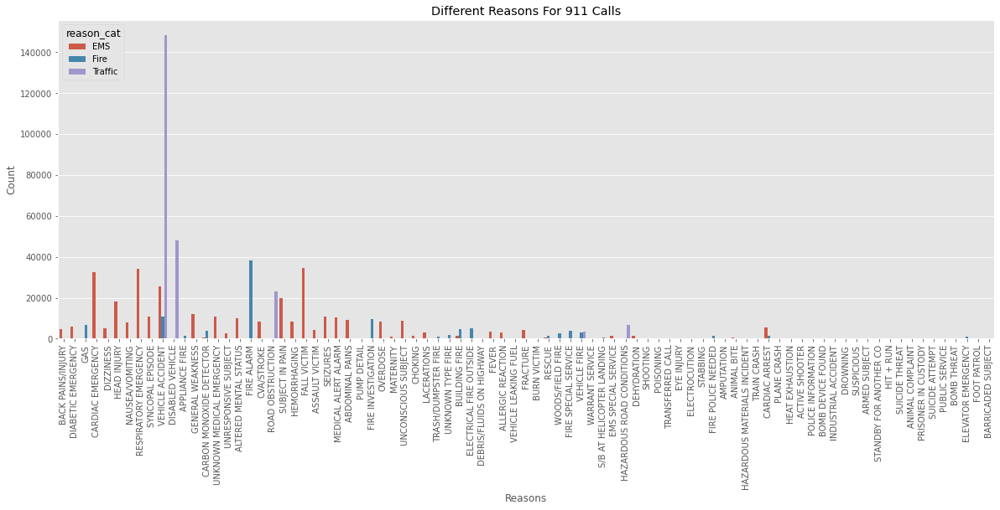

In [25]:
plt.subplots(figsize=(20, 7))

ax = sb.countplot(data['title'], hue=data['reason_cat'], data=data)
ax.set(xlabel='Reasons', ylabel='Count')
plt.title('Different Reasons For 911 Calls')

plt.xticks(rotation=90)

plt.show()

In [26]:
top_10_reasons = data['title'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
fig = px.bar(top_10_reasons, color_discrete_sequence=[px.colors.qualitative.Pastel], orientation='h', text=top_10_reasons['count'].sort_values(ascending=True))

fig.update_layout(title={
                  'text': "Top 10 Reasons for 911 Calls",
                  'y':0.98,
                  'x':0.5,
                  'xanchor': 'center',
                  'yanchor': 'top'},
                  xaxis_title='Reasons',
                  yaxis_title='Count',
                  showlegend=False,
                  template='plotly_white')

fig.show()

* Approximately 28% of all calls are for vehicle accident.
* Followed by disabled vehicle calls which constitutes nearly 7% of all calls.

## 911 calls based on different Zip codes

In [27]:
data['zip'].value_counts()\
           .head(20)\
           .to_frame(name='count')\
           .reset_index()\
           .style.background_gradient(cmap='Greens', subset=['count'])

,index,count
0,19401.000000,45596
1,19464.000000,43902
2,19403.000000,34888
3,19446.000000,32268
4,19406.000000,22456
5,19002.000000,21065
6,19468.000000,18938
7,19046.000000,17885
8,19454.000000,17656
9,19090.000000,17376


In [28]:
top_10_zip = data['zip'].value_counts().to_frame(name='count').head(10).sort_values(by='count')

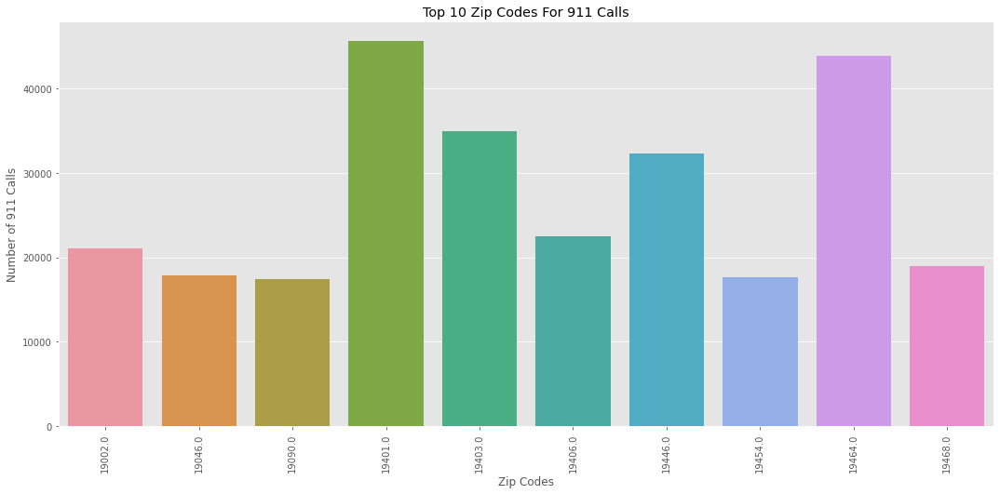

In [29]:
plt.subplots(figsize=(18, 8))
ax = sb.barplot(top_10_zip.index, top_10_zip['count'])
plt.xticks(rotation=90)
ax.set(xlabel='Zip Codes', ylabel='Number of 911 Calls')
plt.title('Top 10 Zip Codes For 911 Calls')

plt.show()

## 911 calls based on different Township

In [30]:
data['twp'].value_counts()\
           .head(20)\
           .to_frame(name='count')\
           .reset_index()\
           .style.background_gradient(cmap='Blues', subset=['count'])

,index,count
0,LOWER MERION,55490
1,ABINGTON,39947
2,NORRISTOWN,37633
3,UPPER MERION,36010
4,CHELTENHAM,30574
5,POTTSTOWN,27387
6,UPPER MORELAND,22932
7,LOWER PROVIDENCE,22476
8,PLYMOUTH,20116
9,UPPER DUBLIN,18862


In [31]:
top_10_twp = data['twp'].value_counts().to_frame(name='count').head(10).sort_values(by='count') 

top_10_twp.iplot(kind='bar', 
                 color='red',
                 gridcolor='white',
                 linecolor='black',
                 theme='pearl',
                 title='Township',
                 yTitle='Number of 911 Calss',
                 bargap=0.3,
                 xTitle='Day of Week'
                 )

# Seaborn Way
# sb.set_style('whitegrid')
# plt.subplots(figsize=(14, 7))
# ax = sb.barplot(top_10_twp.index, top_10_twp['count'])
# plt.xticks(rotation=90)
# ax.set(xlabel='Township', ylabel='Number of 911 Calls')
# plt.title('Top 10 Township For 911 Calls')
# plt.show()

## Datetime

In [32]:
print(f"Minimum year in data: {data['year'].min()}")
print(f"Most recent year in data: {data['year'].max()}")
print(f"Total number of years: {data['year'].max()-data['year'].min()}")

Minimum year in data: 2015
Most recent year in data: 2020
Total number of years: 5


# Analysis on Time: 2015•2019

In [33]:
data.drop(data[data['lng']>-73].index, inplace=True)
data.drop(data[data['lng']<-76].index, inplace=True)

In [34]:
data_15 = data[data['year']==2015]
data_16 = data[data['year']==2016]
data_17 = data[data['year']==2017]
data_18 = data[data['year']==2018]
data_19 = data[data['year']==2019]
data_20 = data[data['year']==2020]

## Top 10 townships from 2015-2020 for 911 calls

In [35]:
top_twp_15 = data_15['twp'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_twp_16 = data_16['twp'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_twp_17 = data_17['twp'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_twp_18 = data_18['twp'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_twp_19 = data_19['twp'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_twp_20 = data_20['twp'].value_counts().to_frame(name='count').head(10).sort_values(by='count')

In [36]:
fig = make_subplots(rows=3, cols=2, 
                   subplot_titles=("Year 2015","Year 2016", "Year 2017", "Year 2018", "Year 2019", "Year 2020"))

fig.add_trace(go.Bar(x = top_twp_15.index, y=top_twp_15['count'], name='2015'), row=1, col=1) 

fig.add_trace(go.Bar(x = top_twp_16.index, y=top_twp_16['count'], name='2016'), row=1, col=2)

fig.add_trace(go.Bar(x = top_twp_17.index, y=top_twp_17['count'], name='2017'), row=2, col=1)

fig.add_trace(go.Bar(x = top_twp_18.index, y=top_twp_18['count'], name='2018'), row=2, col=2)

fig.add_trace(go.Bar(x = top_twp_19.index, y=top_twp_19['count'], name='2019'), row=3, col=1)

fig.add_trace(go.Bar(x = top_twp_20.index, y=top_twp_20['count'], name='2020'), row=3, col=2)

fig.update_layout(title_text='Top Townships for 911 Calls', height=1500, template='plotly_white')

fig.show()

In [37]:
top_twp_20 = data_20['twp'].value_counts().to_frame(name='count').head(10).sort_values(by='count', ascending=False)
top_twp_20.style.background_gradient(cmap='Blues', subset=['count'])

,count
LOWER MERION,5323
NORRISTOWN,4576
ABINGTON,4228
UPPER MERION,3658
POTTSTOWN,3359
CHELTENHAM,3290
LOWER PROVIDENCE,2689
UPPER MORELAND,2577
PLYMOUTH,2194
HORSHAM,1975


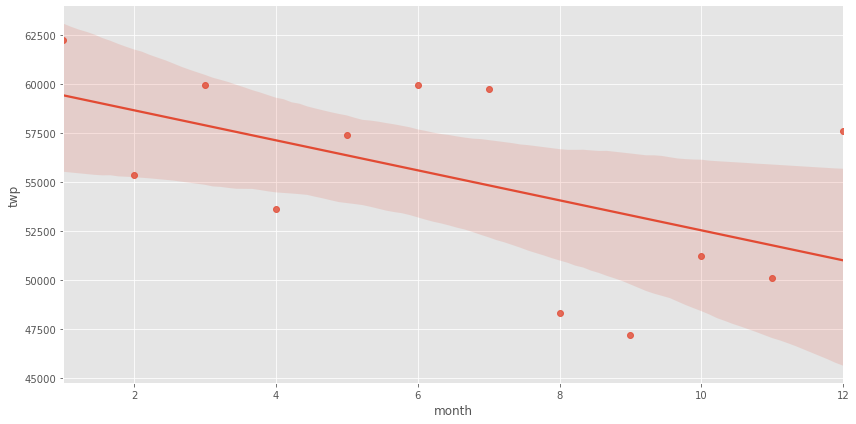

In [38]:
sb.lmplot(x='month', y='twp', data=data.groupby('month').count().reset_index(), height=6, aspect=2)

## Top 10 Reasons from 2015-2020 for 911 calls

In [39]:
top_title_15 = data_15['title'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_title_16 = data_16['title'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_title_17 = data_17['title'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_title_18 = data_18['title'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_title_19 = data_19['title'].value_counts().to_frame(name='count').head(10).sort_values(by='count')
top_title_20 = data_20['title'].value_counts().to_frame(name='count').head(10).sort_values(by='count')

In [40]:
fig = make_subplots(rows=3, cols=2, 
                   subplot_titles=("Year 2015","Year 2016", "Year 2017", "Year 2018", "Year 2019", "Year 2020"))

fig.add_trace(go.Bar(x = top_title_15.index, y=top_title_15['count'], name='2015'), row=1, col=1) 

fig.add_trace(go.Bar(x = top_title_16.index, y=top_title_16['count'], name='2016'), row=1, col=2)

fig.add_trace(go.Bar(x = top_title_17.index, y=top_title_17['count'], name='2017'), row=2, col=1)

fig.add_trace(go.Bar(x = top_title_18.index, y=top_title_18['count'], name='2018'), row=2, col=2)

fig.add_trace(go.Bar(x = top_title_19.index, y=top_title_19['count'], name='2019'), row=3, col=1)

fig.add_trace(go.Bar(x = top_title_20.index, y=top_title_20['count'], name='2020'), row=3, col=2)

fig.update_layout(title_text='Top Reasons for 911 Calls', height=1500, template='plotly_white')

fig.show()

# Folium Map (Location)

In [41]:
map_plot_20 = data[['lat', 'lng', 'twp']].groupby('twp').mean().reset_index()
map_plot_20.head(15).style.background_gradient(cmap='Reds', subset=['lat'])\
                    .background_gradient(cmap='Greens', subset=['lng'])

,twp,lat,lng
0,ABINGTON,40.113117,-75.121183
1,AMBLER,40.157257,-75.220934
2,BERKS COUNTY,40.285548,-75.581870
3,BRIDGEPORT,40.103989,-75.343111
4,BRYN ATHYN,40.136988,-75.063574
5,BUCKS COUNTY,40.259411,-75.268764
6,CHELTENHAM,40.077449,-75.138750
7,CHESTER COUNTY,40.214496,-75.523597
8,COLLEGEVILLE,40.186532,-75.456492
9,CONSHOHOCKEN,40.076381,-75.303204


In [42]:
map_data = folium.Map(location=(40.2547, -75.3405), zoom_start = 11, width='70%', max_zoom=11, min_zoom=11)

for lat, lng, twp in zip(map_plot_20.lat, map_plot_20.lng, map_plot_20.twp):
    folium.Marker(
    radius=1,
    location=[lat, lng],
    color='crimson',
    popup=twp,
    icon=folium.Icon(color='red'),
    ).add_to(map_data)



#  display interactive map
display(map_data)

In [43]:
map_data = folium.Map(location=(40.2547, -75.3405), zoom_start = 11, width='70%', max_zoom=11, min_zoom=11)

for lat, lng in zip(data_20.lat.unique(), data_20.lng.unique()):
    folium.CircleMarker(
    radius=0.7,
    location=[lat, lng],
    color='crimson',
    fill=True,
    fillcolor='crimson'
    ).add_to(map_data)



#  display interactive map
display(map_data)

# Its About Time !

In [44]:
dmap={0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}

mmap={1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'}

data['month']=data['month'].map(mmap)

data['dayofweek']=data['dayofweek'].map(dmap)

## 911 Calls During Week

In [45]:
data['dayofweek'].value_counts()

Fri    102812
Wed     99055
Thu     98573
Tue     97570
Mon     96624
Sat     89317
Sun     78737
Name: dayofweek, dtype: int64

In [46]:
data['dayofweek'].value_counts().iplot(kind='bar', 
                                       color='red',
                                       gridcolor='white',
                                       linecolor='black',
                                       theme='pearl',
                                       title='Calls During Week',
                                       yTitle='Count',
                                       bargap=0.4,
                                       opacity=0.7,
                                       xTitle='Day of Week'
                                      )

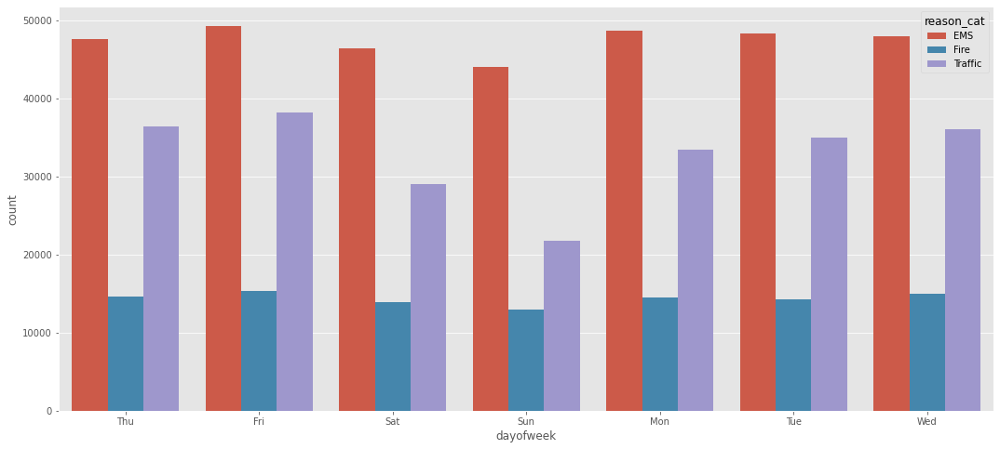

In [47]:
plt.style.use('ggplot')
plt.subplots(figsize=(18, 8))
sb.countplot(data['dayofweek'], hue=data['reason_cat'])

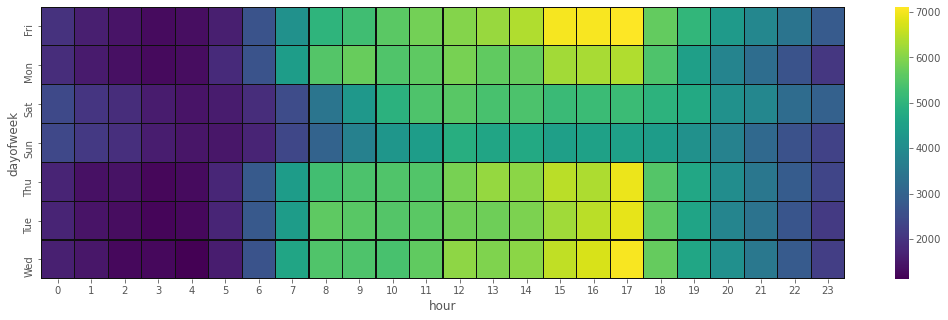

In [48]:
dayHour=data.groupby(by=['dayofweek','hour']).count()['reason_cat'].unstack()

plt.figure(figsize=(18,5))
sb.heatmap(dayHour,cmap='viridis',linewidths=0.1, linecolor='#0f0f0f')

## 911 Calls During Month

In [49]:
data['month'].value_counts()

Jan    62249
Mar    59945
Jun    59940
Jul    59732
Dec    57613
May    57416
Feb    55349
Apr    53620
Oct    51211
Nov    50112
Aug    48320
Sep    47181
Name: month, dtype: int64

In [50]:
data['month'].value_counts().iplot(kind='bar', 
                                       color='green',
                                       gridcolor='white',
                                       linecolor='black',
                                       theme='pearl',
                                       bargap=0.3,
                                       opacity=0.7,
                                       title='Calls During Month',
                                       yTitle='Count',
                                       xTitle='Month'
                                      )

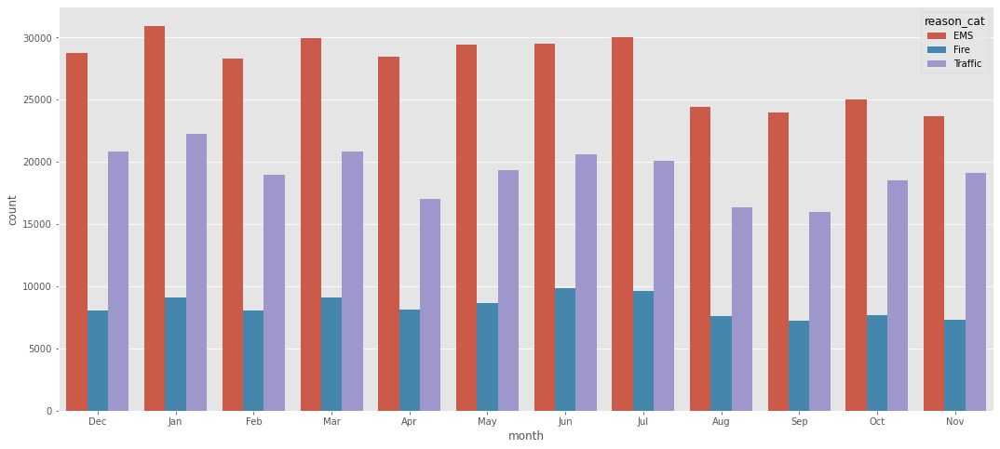

In [51]:
plt.style.use('ggplot')
plt.subplots(figsize=(18, 8))
sb.countplot(data['month'], hue=data['reason_cat'])

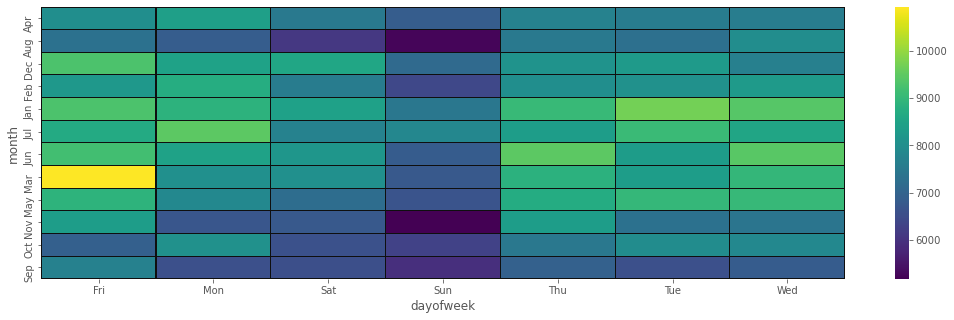

In [52]:
dayHour=data.groupby(by=['month','dayofweek']).count()['reason_cat'].unstack()

plt.figure(figsize=(18,5))
sb.heatmap(dayHour,cmap='viridis',linewidths=0.1, linecolor='#0f0f0f')

## 911 Calls Yearly

In [53]:
data['year'].value_counts()

2018    151424
2019    148876
2016    142310
2017    140286
2020     71882
2015      7910
Name: year, dtype: int64

In [54]:
data['year'].value_counts().iplot(kind='bar', 
                                       gridcolor='white',
                                       linecolor='black',
                                       theme='pearl',
                                       bargap=0.3,
                                       opacity=0.7,
                                       title='Yearly Calls',
                                       yTitle='Count',
                                       xTitle='Year'
                                      )

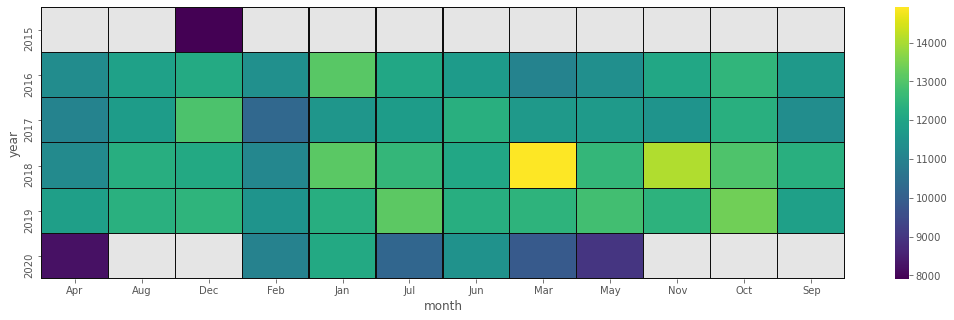

In [55]:
dayHour=data.groupby(by=['year','month']).count()['reason_cat'].unstack()

plt.figure(figsize=(18,5))
sb.heatmap(dayHour,cmap='viridis',linewidths=0.1, linecolor='#0f0f0f')

Here, grey boxes represent the lack of data.

<div style="color:white;
           display:fill;
           border-radius:5px;
           background-color:#5642C5;
           font-size:110%;
           font-family:Verdana;
           letter-spacing:0.9px">
    <p style="padding: 10px;
              color:white;
              font-size:110%">
        If you like this notebook, please give it an <span style="color:#F28835;"><b><i>upvote</i></b></span> as it keeps me motivated to create more quality kernels.<br>Keep on Learning !!
    </p>
</div>